# Setup

Retrieve "GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv" from [this GitHub link](https://github.com/nasa/GeneLab_Data_Processing/blob/master/scRNAseq/10X_Chromium_3prime_Data/GeneLab_CellType_GeneMarkers/GL-DPPD-7111_GeneMarker_Files/GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv) and save it in the same directory as this notebook. The GitHub path is `nasa/GeneLab_Data_Processing/scRNAseq/10X_Chromium_3prime_Data/GeneLab_CellType_GeneMarkers/GL-DPPD-7111_GeneMarker_Files`.



Possible Map My Cells region keys = ["RHP", "RSP", "ACA", "PL-ILA-ORB", "AUD-TEa-PERI-ECT", "SS-GU-VISC", "MO-FRP", "PAL", "sAMY", "CTXsp", "HY", "STRv", "OLF", "LSX", "AI", "STRd", "VIS-PTLp", "VIS", "TH", "MOp", "ENT", "HIP", "P", "MB", "MY", "CB", "AUD", "SSp", "TEa-PERI-ECT"]

---

**Use Conda**

While in the folder containing this notebook:
`conda env create -f rapidsc.yml`



Navigate back to where you want to clone the `scflow` repository (I recommend home)
`cd`

Clone `scflow` from GitHub.
`git clone git@github.com:easlinger/scflow.git`

Navigate to the folder where `scflow` is:
`pip install .`

`pip install senepy`

---

**For NVIDIA Drivers (Linux)**

```
sudo apt update
sudo apt install -y build-essential dkms

sudo apt install -y wget
wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64/cuda-ubuntu2204.pin
sudo mv cuda-ubuntu2204.pin /etc/apt/preferences.d/cuda-repository-pin-600
sudo apt-key adv --fetch-keys https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64/3bf863cc.pub
sudo add-apt-repository "deb https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64/ /"

sudo apt update
sudo apt install -y cuda
```

---


## Set Options (ACTIVELY SET THESE!)

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import re
import json
try:
    import torch
    torch.set_float32_matmul_precision("medium")
except Exception:
    pass
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import pandas as pd
import numpy as np
import scflow

# If You Want Results Emailed
cur_file = os.path.join(os.path.abspath(""), "create_object_613.ipynb")
html_out = os.path.splitext(cur_file)[0] + ".html"
email = "elizabeth.aslinger@aya.yale.edu"
# set email to None to skip

# Set Data Sources & Species
species = "Mouse"
batches = ["OSD-613"]  # in list even if just 1, or list multiple to integrate

# Set Source Data Directory & Output Options
superdirec = "/home/easlinger/data"  # directory with original data
direcs = [os.path.join(superdirec, i) for i in batches]
# new h5ad will write to "data" sub-directory of where this notebook is
overwrite = True  # allow overwrite of files?
file_concat = os.path.join("data", f"{'_'.join(batches)}_concatenated.h5ad")
file_new = os.path.join("data", f"{'_'.join(batches)}_integrated.h5ad")

# Set Sample & Batch IDs, Plus Other Potential Sources of Batch Effects
col_group = "Group"  # age &/or space flight
col_sample = "sample"
col_batch = "batch" if len(
    batches) > 1 else col_group  # group=batch if 1 dataset
covariates_categorical = ["Comment[Euthanasia Date]"]
# covariates_categorical = None

# Do Sub-Clustering?
# subcluster_biggest = 1  # sub-cluster biggest cluster
# subcluster_biggest = 3  # sub-cluster biggest 3 clusters
subcluster_biggest = False  # no sub-clustering
kws_cluster = dict()  # cluster individual samples
# kws_cluster = None  # do not cluster individual samples

# Set Annotation Sources
map_my_cells_source = "WMB-10X" if species == "Mouse" else "WHB-10X" if (
    species == "Human") else None  # Map My Cells atlas source
# map_my_cells_region_keys = None
map_my_cells_region_keys = [
    "RSP", "ACA", "PL-ILA-ORB", "AUD-TEa-PERI-ECT", "SS-GU-VISC", "MO-FRP",
    "AI", "VIS-PTLp", "VIS", "MOp", "AUD", "SSp",
    "TEa-PERI-ECT"]  # regional subset for Map My Cells
map_my_cells_cell_keys = ["Isocortex"]  # pattern match: feature name column
if species == "Mouse":
    model_celltypist = "Mouse_Whole_Brain.pkl"
else:
    raise ValueError("Manually set CellTypist model for non-mouse!")
source_patterns = ["Brain", "Cortical", "cortex"]  # for ToppGene

# Make Pre-Defined Marker Dictionary
celltypes_superhierarchical = {
    "Neuron": ["Excitatory", "Inhibitory", "Glutamatergic", "GABAergic",
               "Dopaminergic", "Serotonergic", "Cholinergic"]
}  # if classified as Neuron + other, just keep more specific type(s)
rename_marker_based_annotation = {
    "Excitatory | Inhibitory": "Excitatory-Inhibitory",
    "Inhibitory | Inhibitory": "Excitatory-Inhibitory"
}
mks_a_priori = pd.read_csv("GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv")
mks_a_priori.loc[:, "cellName"] = mks_a_priori.cellName.replace({
    "Oligodendrocyte precursor cell": "OPC"}).apply(
        lambda x: " ".join([i.capitalize() for i in re.sub(
            " cell", "", x).split(" ")])).replace({
                "Opc": "OPC"})  # capitalize cell names
mks_a_priori = mks_a_priori.set_index("cellName")["geneSymbol"]
mks_a_priori = dict(mks_a_priori.apply(lambda x: set(x.split(","))))
mks_a_priori.update({
    "Neuroepithelial": {"Nes", "Notch1", "Sox2", "Sox10", "Hes1", "Hes3"},
    "Excitatory": {"Slc17a7", "Slc30a3", "Tcf4",
                   "Slc17a6", "Slc6a1", "Baiap3",
                   "Grin1", "Grin2b", "Gls"},
    "Inhibitory": {"Gad1", "Slc6a1", "Gabbr1", "Gabbr2",
                   "Gad2", "Slc32a1", "Oprm1", "Htr2c"},
    # "Glutamatergic": {"Slc17a7", "Slc17a6", "Grin1", "Grin2b", "Gls"},
    # "GABAergic": {"Slc6a1", "Gabbr1", "Gabbr2", "Gad2", "Gad1"},
    # "Dopaminergic": {"Th", "Dat", "Foxa2", "Girk2", "Nurr1", "Lmx1b"},
    # "Serotonergic": {"Tph", "Sert", "Pet1"},
    # "Cholinergic": {"ChAT", "VAChT", "Acetylcholinesterase"}
})
markers_predefined = {**mks_a_priori}
if celltypes_superhierarchical is not None:
    for i in celltypes_superhierarchical:
        for k in [u for u in celltypes_superhierarchical[
                i] if u in markers_predefined]:
            markers_predefined[k] = markers_predefined[k].union(
                markers_predefined[i])
    _ = [markers_predefined.pop(i) for i in celltypes_superhierarchical]

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/jaxopt/__init__.py:59: DeprecationWarning: JAXopt is no longer maintained. See https://docs.jax.dev/en/latest/ for alternatives.
  warnings.warn(
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/marshmallow/__init__.py:17: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  __version_info__ = tuple(LooseVersion(__version__).version)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/marshmallow/fields.py:198: RemovedInMarshmallow4Warning: Passing field metadata as a keyword arg is deprecated. Use the explicit `metadata=...` argument instead.
  warnings.warn(
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/pkg_resources/__init__.py:3146: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('sphinxcontrib')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_nam

## Load Individual Sample Data

In [2]:
%%time

# Display & Parallel Processing Options
pd.set_option("display.max_rows", 500)  # or None for unlimited rows
pd.set_option("display.max_columns", 100)
pd.set_option("display.width", 200)
n_processors = os.cpu_count() - 1  # how many processors to use

# Create a Subdirectory of Working Directory for Data Outputs
os.makedirs("data", exist_ok=True)

# Get Metadata
metadata = [pd.read_csv(os.path.join(
    superdirec, f"{i}_metadata_{i}-ISA/s_{i}.txt"), sep=None,
                        engine="python").set_index("Source Name").rename_axis(
                            col_sample) for i in batches]  # list of metadata
for u in np.arange(len(metadata)):
    metadata[u] = metadata[u].join(metadata[u].apply(
        lambda x: x["Factor Value[Spaceflight]"] + str(
            " | " + str(x["Factor Value[Age]"]) + " Weeks" if (
                "Factor Value[Age]" in metadata[u].columns and len(
                    metadata[u]["Factor Value[Age]"].unique()) > 1) else ""),
        axis=1).to_frame(col_group))  # add space flight (x age if applicable)

# Load Data
adatas, files = {}, {}
for u, d in enumerate(direcs):
    for x in [i for i in os.listdir(d) if os.path.isdir(os.path.join(d, i))]:
        ddd = [os.path.join(d, x, i) for i in os.listdir(os.path.join(d, x))]
        if len(ddd) > 1:
            raise ValueError(f"More than one file: {ddd}")
        sample = os.path.basename(os.path.join(d, x, ddd[0]))
        files[sample] = os.path.join(os.path.join(d, x, ddd[0]),
                                     "filtered_feature_bc_matrix.h5")
        adatas[sample] = sc.read_10x_h5(files[sample])
        if col_batch:
            adatas[sample].obs.loc[:, col_batch] = batches[u]
        adatas[sample].obs.loc[:, col_sample] = sample
        samp_metadata = metadata[u].loc[sample] if (
            sample in metadata[u].index.values) else metadata[u].set_index(
                "Sample Name").loc[sample]
        for v in samp_metadata.index.values:
            adatas[sample].obs.loc[:, v] = samp_metadata.loc[v]
        adatas[sample].obs.loc[:, f"n_cells_original_{col_sample}"] = adatas[
            sample].obs.shape[0]
files

CPU times: user 15.6 s, sys: 1.54 s, total: 17.2 s
Wall time: 17.1 s


{'RRRM2_BRN_GC_ISS-T_YNG_GY4': '/home/easlinger/data/OSD-613/RRRM2_BRN_GC_ISS-T_YNG_GY4-20250307T191036Z-001/RRRM2_BRN_GC_ISS-T_YNG_GY4/filtered_feature_bc_matrix.h5',
 'RRRM2_BRN_GC_ISS-T_YNG_GY9': '/home/easlinger/data/OSD-613/RRRM2_BRN_GC_ISS-T_YNG_GY9-20250307T192252Z-001/RRRM2_BRN_GC_ISS-T_YNG_GY9/filtered_feature_bc_matrix.h5',
 'RRRM2_BRN_GC_ISS-T_OLD_GO18': '/home/easlinger/data/OSD-613/RRRM2_BRN_GC_ISS-T_OLD_GO18-20250307T185055Z-001/RRRM2_BRN_GC_ISS-T_OLD_GO18/filtered_feature_bc_matrix.h5',
 'RRRM2_BRN_FLT_ISS-T_OLD_FO20': '/home/easlinger/data/OSD-613/RRRM2_BRN_FLT_ISS-T_OLD_FO20-20250307T162503Z-001/RRRM2_BRN_FLT_ISS-T_OLD_FO20/filtered_feature_bc_matrix.h5',
 'RRRM2_BRN_GC_ISS-T_OLD_GO19': '/home/easlinger/data/OSD-613/RRRM2_BRN_GC_ISS-T_OLD_GO19-20250307T185555Z-001/RRRM2_BRN_GC_ISS-T_OLD_GO19/filtered_feature_bc_matrix.h5',
 'RRRM2_BRN_GC_ISS-T_OLD_GO13': '/home/easlinger/data/OSD-613/RRRM2_BRN_GC_ISS-T_OLD_GO13-20250307T164505Z-001/RRRM2_BRN_GC_ISS-T_OLD_GO13/filtered_

# QC

## Perform Sample-Specific QC

In [3]:
%matplotlib inline

plot_qc = False  # change to get QC plots (a bit slow)
qcs, n_cells_by_counts, descriptives, figs = scflow.pp.perform_qc_multi(
    adatas, col_batch=col_batch, col_sample=col_sample, plot=plot_qc,
    percentiles=[0.025, 0.10, 0.25, 0.50, 0.75, 0.85, 0.90, 0.975],
    figsize=(10, 10))
descriptives.stack().unstack("Variable").round()

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/IPython/extensions/deduperreload/deduperreload.py:290: DeprecationWarning: ast.Ellipsis is deprecated and will be removed in Python 3.14; use ast.Constant instead
  elif not isinstance(ast_elt, (ast.Ellipsis, ast.Pass)):


Variable                                                       n_cells_by_counts  n_genes_by_counts  pct_counts_mt  total_counts
sample                       Group                     Metric                                                                   
RRRM2_BRN_FLT_ISS-T_OLD_FO14 Space Flight | 29 Weeks   count             56748.0             4260.0         4260.0        4260.0
                                                       mean                228.0             3040.0            2.0       10679.0
                                                       std                 548.0             1730.0            3.0        9449.0
                                                       min                   0.0                5.0            0.0           5.0
                                                       2.5%                  0.0              719.0            0.0        1129.0
                                                       10%                   0.0              931.0            0.0        1641.0
                                                       25%                   0.0             1271.0            0.0        2478.0
                                                       50%                   3.0             3182.0            1.0        8793.0
                                                       75%                 109.0             4415.0            2.0       15769.0
                                                       85%                 440.0             4972.0            3.0       20076.0
                                                       90%                 802.0             5327.0            4.0       23291.0
                                                       97.5%              2114.0             6255.0           10.0       33911.0
                                                       max                4252.0             9857.0           46.0       69813.0
RRRM2_BRN_FLT_ISS-T_OLD_FO16 Space Flight | 29 Weeks   count             56748.0             4863.0         4863.0        4863.0
                                                       mean                288.0             3358.0            4.0       11512.0
                                                       std                 671.0             1890.0            6.0       10039.0
                                                       min                   0.0               71.0            0.0         139.0
                                                       2.5%                  0.0              766.0            0.0        1213.0
                                                       10%                   0.0              983.0            0.0        1710.0
                                                       25%                   0.0             1396.0            1.0        2727.0
                                                       50%                   3.0             3551.0            3.0        9776.0
                                                       75%                 130.0             4796.0            6.0       16856.0
                                                       85%                 601.0             5431.0            8.0       21349.0
                                                       90%                1077.0             5831.0           10.0       24861.0
                                                       97.5%              2573.0             6861.0           20.0       36130.0
                                                       max                4861.0             9750.0           66.0       97274.0
RRRM2_BRN_FLT_ISS-T_OLD_FO17 Space Flight | 29 Weeks   count             56748.0             1493.0         1493.0        1493.0
                                                       mean                 37.0             1423.0            4.0        3043.0
                                                       std                 106.0             1042.0            4.0        3380.0
 

## Auto-Detect Filtering Thresholds

Use 2.5th and/& 97.5th percentile (sample-specific) as minimum genes per cell and minimum and maximum total counts (subject to specified absolute minima). Use 97.5th percentile as upper bound for percent mitochondrial count. 

Use an absolute minimum cells per gene.

Also include arguments to run a PCA on individual samples before integrating.

In [4]:
# Options
bounds = descriptives[["2.5%", "97.5%"]].apply(lambda x: list(
    x), axis=1).unstack("Variable")  # list top/bottom 5% (~sample, variable)
abs_min_cells = 20  # regardless of %ile, minimum cells to retain gene
abs_min_genes = 200  # regardless of %ile, minimum genes to retain cell
abs_min_count = 300  # regardless of %ile, minimum counts to retain cell
abs_max_mt = 10

# Set Thresholds
kws_pp = {}
for x in adatas:
    b_x = bounds.loc[x]
    b_counts =  b_x["total_counts"] if isinstance(b_x[
            "total_counts"], list) else b_x["total_counts"].iloc[0]
    b_counts = [max(b_counts[0], abs_min_count), b_counts[1]]
    kws_pp[x] = {
        "min_max_genes": [max((b_x["n_genes_by_counts"] if isinstance(
            b_x["n_genes_by_counts"], list) else b_x[
                "n_genes_by_counts"].iloc[0])[0], abs_min_genes), None],
        "min_max_cells": [abs_min_cells, None],
        # "min_max_cells": [max((b_x["n_cells_by_counts"] if isinstance(
        #     b_x["n_genes_by_counts"], list) else b_x[
        #         "n_genes_by_counts"].iloc[0])[0], abs_min_cells), None],
        # "max_mt": min(abs_max_mt, (b_x["pct_counts_mt"] if isinstance(b_x[
        #     "pct_counts_mt"], list) else b_x["pct_counts_mt"].iloc[0])[1]),
        "max_mt": abs_max_mt,
        "min_max_counts": b_counts,
        # "vars_regress_out": ["total_counts"],
        "zero_center": True, "max_value": 10,  # scaling
        "doublet_detection": "drop"
    }
print("\n".join([f"{s}: {kws_pp[s]}" for s in kws_pp]))
pd.DataFrame(kws_pp).T

RRRM2_BRN_GC_ISS-T_YNG_GY4: {'min_max_genes': [321.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [414.0, 11122.175000000005], 'zero_center': True, 'max_value': 10, 'doublet_detection': 'drop'}
RRRM2_BRN_GC_ISS-T_YNG_GY9: {'min_max_genes': [703.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [1006.1500000000001, 23784.40000000001], 'zero_center': True, 'max_value': 10, 'doublet_detection': 'drop'}
RRRM2_BRN_GC_ISS-T_OLD_GO18: {'min_max_genes': [326.1, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [422.1, 13468.399999999998], 'zero_center': True, 'max_value': 10, 'doublet_detection': 'drop'}
RRRM2_BRN_FLT_ISS-T_OLD_FO20: {'min_max_genes': [628.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [895.0, 19711.0], 'zero_center': True, 'max_value': 10, 'doublet_detection': 'drop'}
RRRM2_BRN_GC_ISS-T_OLD_GO19: {'min_max_genes': [666.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [

,min_max_genes,min_max_cells,max_mt,min_max_counts,zero_center,max_value,doublet_detection
RRRM2_BRN_GC_ISS-T_YNG_GY4,"[321.0, None]","[20, None]",10,"[414.0, 11122.175000000005]",True,10,drop
RRRM2_BRN_GC_ISS-T_YNG_GY9,"[703.0, None]","[20, None]",10,"[1006.1500000000001, 23784.40000000001]",True,10,drop
RRRM2_BRN_GC_ISS-T_OLD_GO18,"[326.1, None]","[20, None]",10,"[422.1, 13468.399999999998]",True,10,drop
RRRM2_BRN_FLT_ISS-T_OLD_FO20,"[628.0, None]","[20, None]",10,"[895.0, 19711.0]",True,10,drop
RRRM2_BRN_GC_ISS-T_OLD_GO19,"[666.0, None]","[20, None]",10,"[942.0, 21190.0]",True,10,drop
RRRM2_BRN_GC_ISS-T_OLD_GO13,"[822.975, None]","[20, None]",10,"[1282.925, 23156.550000000007]",True,10,drop
RRRM2_BRN_FLT_ISS-T_YNG_FY8,"[481.425, None]","[20, None]",10,"[681.7, 27907.149999999994]",True,10,drop
RRRM2_BRN_FLT_ISS-T_YNG_FY7,"[331.925, None]","[20, None]",10,"[452.77500000000003, 13453.3]",True,10,drop
RRRM2_BRN_FLT_ISS-T_OLD_FO19,"[200, None]","[20, None]",10,"[300, 14724.999999999998]",True,10,drop
RRRM2_BRN_GC_ISS-T_YNG_GY7,"[798.75, None]","[20, None]",10,"[1176.375, 28050.25]",True,10,drop


# Integrate

## In-Memory Approach

See the "On-Disk Approach" for a more sophisticated approach to defining `kws_integrate` (more options).

In [5]:
# %%time

# # Integrate
# join_method = "outer"  # or "inner"
# kws_integrate = {"kws_pp": kws_pp, "n_top_genes": 10000,
#                  "fill_value": np.nan,
#                  "col_batch": None,  # suppress using batch as covariate
#                  "join": join_method, "merge": "unique", "use_rapids": True}
# self = scflow.Rna(adatas, col_sample=col_sample, col_batch=col_batch,
#                   kws_integrate=kws_integrate)
# self.rna.obs = self.rna.obs.assign(kws_integrate=str(kws_integrate))

# # Write Files for Processed/Integrated Objects?
# if overwrite is True or not os.path.exists(file_new):
#     os.makedirs("data", exist_ok=True)
#     self.rna.write_h5ad(file_new)
# for x in adatas:
#     pfp = os.path.join("data", f"{x}_processed.h5ad")
#     if overwrite is True or not os.path.exists(pfp):
#         adatas[x].write_h5ad(pfp)
# del adatas  # to save memory; now integrated in `self.rna`

# # Display
# print(self.rna)
# # print(self.rna.var.head())
# self.rna.obs

## On-Disk Approach

### Process (& Optionally Cluster) Individual Files



RRRM2_BRN_GC_ISS-T_YNG_GY4
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 8542 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Source

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.15
Detected doublet rate = 5.9%
Estimated detectable doublet fraction = 60.3%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 9.8%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


2025-08-17 20:24:40 | [INFO] init
... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as ca



RRRM2_BRN_GC_ISS-T_YNG_GY9
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 6044 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Source

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.19
Detected doublet rate = 4.0%
Estimated detectable doublet fraction = 55.4%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 7.2%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_GC_ISS-T_OLD_GO18
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 6503 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sourc

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.16
Detected doublet rate = 4.8%
Estimated detectable doublet fraction = 55.9%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 8.5%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_FLT_ISS-T_OLD_FO20
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 5641 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sour

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.20
Detected doublet rate = 2.8%
Estimated detectable doublet fraction = 54.3%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 5.2%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_GC_ISS-T_OLD_GO19
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 8476 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sourc

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.15
Detected doublet rate = 5.6%
Estimated detectable doublet fraction = 66.2%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 8.5%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_GC_ISS-T_OLD_GO13
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 3880 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sourc

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.22
Detected doublet rate = 2.1%
Estimated detectable doublet fraction = 52.7%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.0%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access

***Performing Leiden clustering with resolution 0.15...


... storing 'interval' as categorical




RRRM2_BRN_FLT_ISS-T_YNG_FY8
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 5658 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sourc

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.18
Detected doublet rate = 3.2%
Estimated detectable doublet fraction = 56.2%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 5.7%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_FLT_ISS-T_YNG_FY7
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 4238 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sourc

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.14
Detected doublet rate = 5.8%
Estimated detectable doublet fraction = 59.9%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 9.7%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_FLT_ISS-T_OLD_FO19
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 7265 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sour

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.24
Detected doublet rate = 2.3%
Estimated detectable doublet fraction = 28.4%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 8.2%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_GC_ISS-T_YNG_GY7
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 5776 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Source

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.18
Detected doublet rate = 3.5%
Estimated detectable doublet fraction = 55.2%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 6.4%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_FLT_ISS-T_OLD_FO14
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 4260 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sour

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.22
Detected doublet rate = 1.8%
Estimated detectable doublet fraction = 47.7%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 3.8%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_GC_ISS-T_YNG_GY1
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 3968 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Source

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.21
Detected doublet rate = 2.1%
Estimated detectable doublet fraction = 43.2%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.9%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_FLT_ISS-T_YNG_FY2
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 4125 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sourc

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.21
Detected doublet rate = 1.9%
Estimated detectable doublet fraction = 46.8%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.0%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_FLT_ISS-T_OLD_FO17
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 1493 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sour

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.20
Detected doublet rate = 2.9%
Estimated detectable doublet fraction = 30.6%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 9.4%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_GC_ISS-T_OLD_GO16
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 20000 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sour

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.43
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 7.4%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.2%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_FLT_ISS-T_OLD_FO16
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 4863 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sour

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.21
Detected doublet rate = 2.3%
Estimated detectable doublet fraction = 43.5%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 5.3%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_GC_ISS-T_YNG_GY2
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 10779 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sourc

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.17
Detected doublet rate = 5.1%
Estimated detectable doublet fraction = 50.9%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 9.9%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access



RRRM2_BRN_FLT_ISS-T_YNG_FY5
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 4714 × 56748
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Sourc

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.18
Detected doublet rate = 3.1%
Estimated detectable doublet fraction = 54.1%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 5.7%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
***Calculating PCA with None components...
***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.5...
***Performing Leiden clustering with resolution 0.15...


... storing 'Group' as categorical
... storing 'sample' as categorical
... storing 'Characteristics[Organism]' as categorical
... storing 'Term Source REF' as categorical
... storing 'Term Accession Number' as categorical
... storing 'Characteristics[Strain]' as categorical
... storing 'Term Source REF.1' as categorical
... storing 'Term Accession Number.1' as categorical
... storing 'Characteristics[Genotype]' as categorical
... storing 'Term Source REF.2' as categorical
... storing 'Term Accession Number.2' as categorical
... storing 'Characteristics[Animal Source]' as categorical
... storing 'Characteristics[Sex]' as categorical
... storing 'Term Source REF.3' as categorical
... storing 'Term Accession Number.3' as categorical
... storing 'Factor Value[Spaceflight]' as categorical
... storing 'Term Source REF.4' as categorical
... storing 'Term Accession Number.4' as categorical
... storing 'Unit' as categorical
... storing 'Term Source REF.5' as categorical
... storing 'Term Access

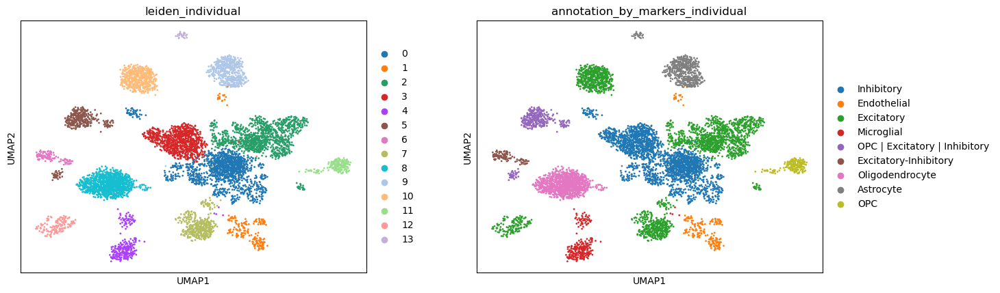

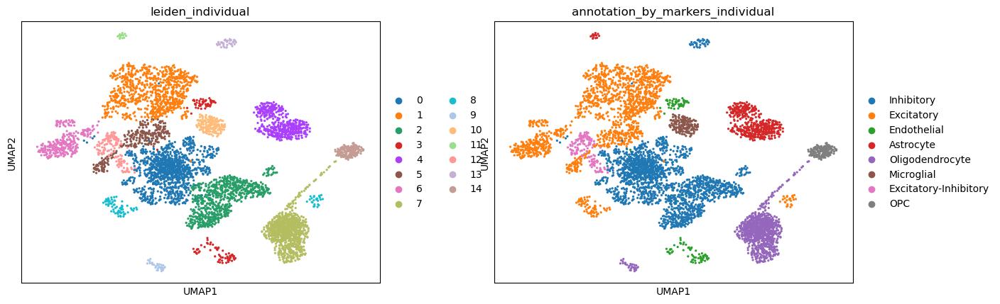

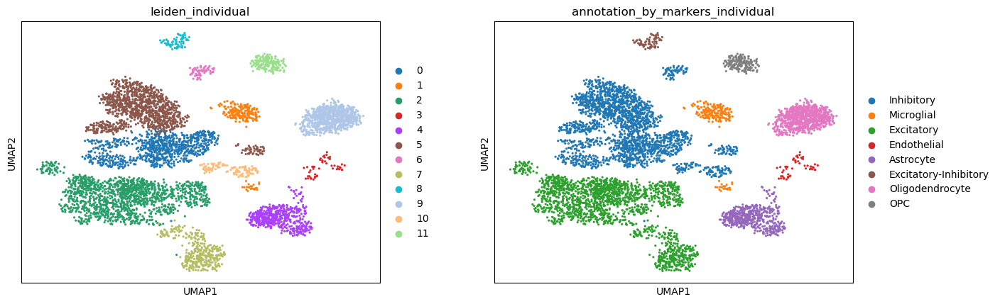

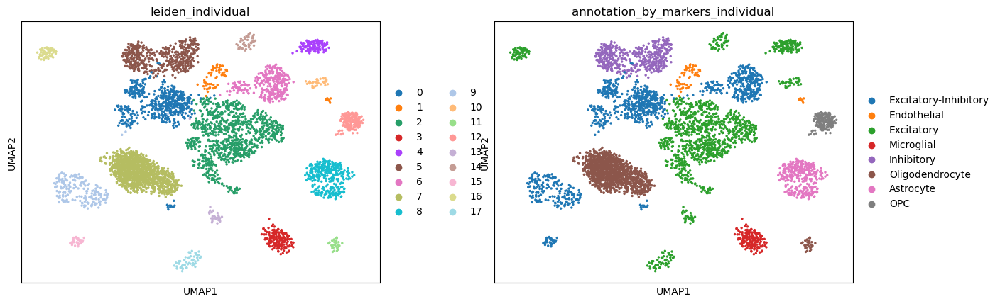

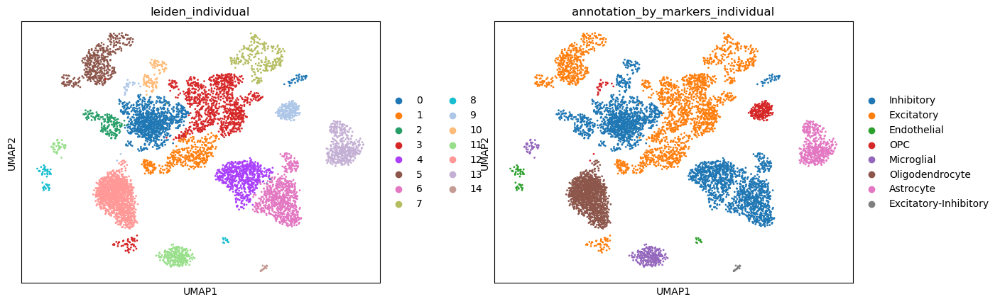

...

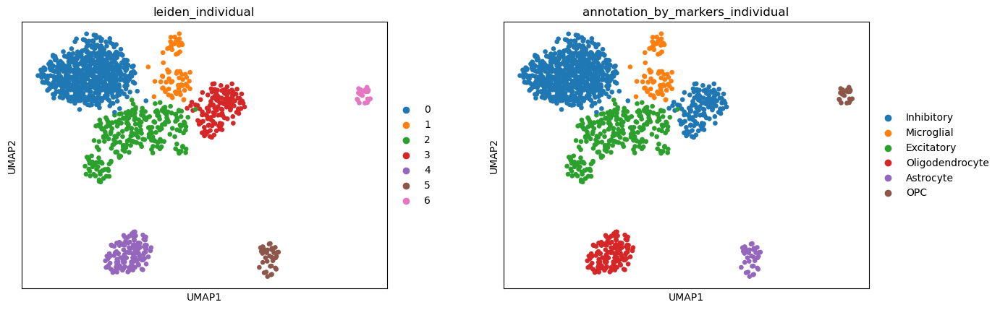

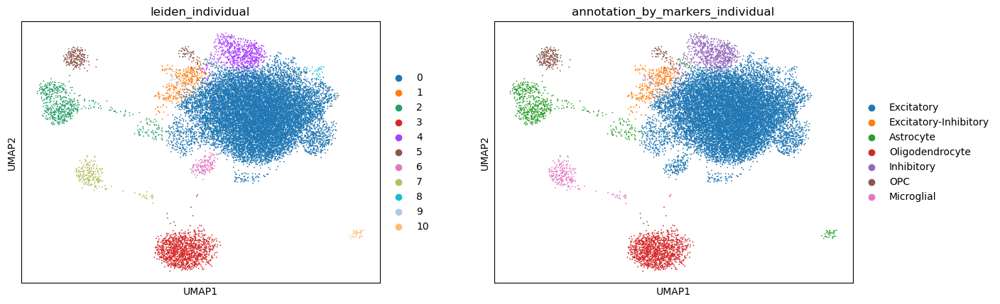

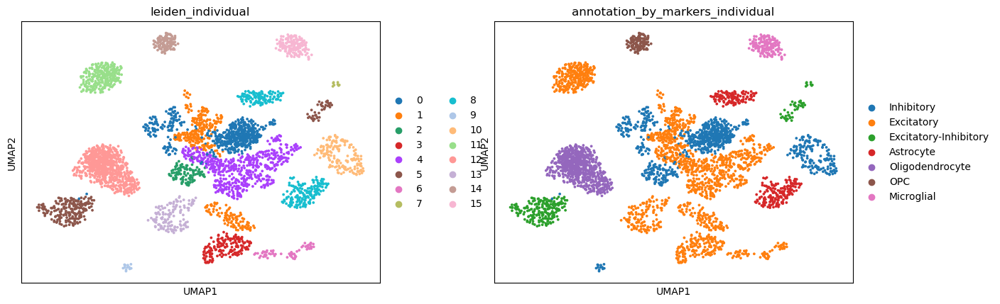

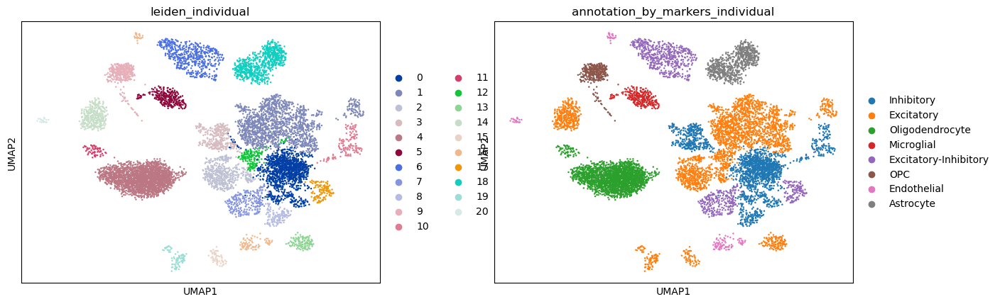

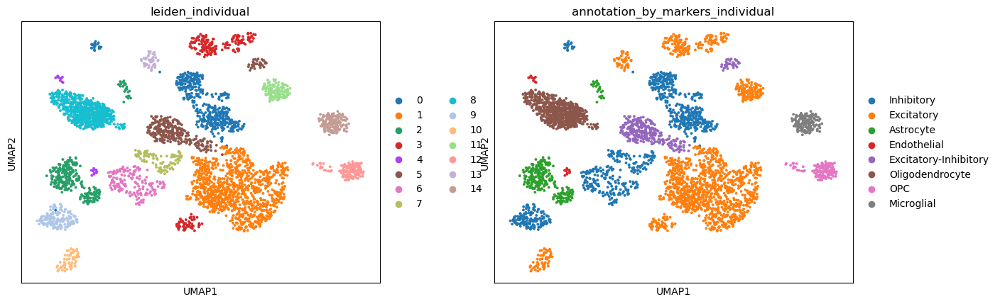

12209 genes present in all samples post-filtering (out of 23329 total genes present in any post-filter sample)
CPU times: user 3min 37s, sys: 13.7 s, total: 3min 51s
Wall time: 1min 1s


In [ ]:
%%time

# Clustering Parameter Options (Only Applied If `kws_cluster` != None)
resolution_individual, min_dist_individual = 0.15, 1.5
# resolution_individual, min_dist_individual = 0.1, 1  # clean but miss neuron
col_cluster_individual = "annotation_by_markers_individual"
unlabeled_cat = "Heterogeneous"  # if can't find one best-fit cell label
cci_scanvi = col_cluster_individual + "_heterogeneous_collapsed"
sep = " | "  # separator for heterogeneous annotations

# Preprocessing & (Optionally) Clustering
if overwrite is False and os.path.exists(pfp):
    raise ValueError("Must be able to overwrite to use on-disk option")
files_individual = dict(zip(files.keys(), [os.path.join(
    "data", f"{x}_processed.h5ad") for x in files]))
var_names = []
# del adatas
for x in files:  # iterate sample files
    print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}")
    for i in kws_pp[x]:  # iterate preprocessing arguments & add to .obs
        adatas[x].obs = adatas[x].obs.assign(**{i: str(kws_pp[x][i])})
    adatas[x] = scflow.pp.preprocess(
        adatas[x], **kws_pp[x], plot_qc=False)  # preprocess data
    if kws_cluster is not None:  # cluster individual sample?
        adatas[x].obs = adatas[x].obs.assign(
            resolution_individual=resolution_individual).assign(
                min_dist_individual=min_dist_individual)  # store parameters
        adatas[x] = scflow.pp.cluster(
            adatas[x], resolution=resolution_individual,
            min_dist=min_dist_individual, plot=False,
            col_celltype="leiden_individual", **kws_cluster)  # cluster
        sc.tl.rank_genes_groups(
            adatas[x], "leiden_individual", n_genes=None, rankby_abs=False,
            key_added="rank_genes_groups_leiden_individual",
            copy=False)  # find markers/DEGs
        if mks_a_priori is not None:  # annotate cell types?
            _, adatas[x] = scflow.pp.annotate_by_marker_overlap(
                adatas[x], markers_predefined,
                col_celltype="leiden_individual",
                col_celltype_new=col_cluster_individual, sep=sep,
                celltypes_superhierarchical=celltypes_superhierarchical,
                # top_n_markers=20,
                adj_pval_threshold=1e-10,
                method="overlap_count", inplace=True)  # annotate by markers
            if rename_marker_based_annotation is not None:
                adatas[x].obs.loc[:, col_cluster_individual] = adatas[x].obs[
                    col_cluster_individual].replace(
                        rename_marker_based_annotation)  # re-name
            adatas[x].obs.loc[:, cci_scanvi] = adatas[x].obs[
                col_cluster_individual].apply(lambda x: unlabeled_cat if (
                    sep in x) else x)  # re-label heterogeneous annotations
    adatas[x].write_h5ad(files_individual[x])  # write individual file
    var_names += [set(adatas[x].var_names)]  # track what genes still present
    # var_names += [set(ann.var_names)]
if kws_cluster is not None:
    for x in files:  # iterate sample files
        ccs = [v for v in ["leiden_individual", col_cluster_individual
                           ] if v in adatas[x].obs]  # columns for UMAP
        sc.pl.umap(adatas[x], color=ccs, wspace=0.4)  # plot UMAP
        print(adatas[x])

# Decide Join Method
shared_genes = set.intersection(*var_names)  # genes in all after filtering
all_genes = set.union(*var_names)  # genes in any post-filter sample
print(f"{len(shared_genes)} genes present in all samples post-filtering (out"
      f" of {len(all_genes)} total genes present in any post-filter sample)")
join_method = "inner" if len(shared_genes) / len(all_genes) >= 0.5 else \
    "outer"  # outer join if <1/2 of genes shared across all samples
del adatas  # to save memory

### Concatenate & Integrate

If you are concerned about hard drive space, you may want to delete `file_concat` and `files_individual` after running this cell.

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/IPython/extensions/deduperreload/deduperreload.py:290: DeprecationWarning: ast.Ellipsis is deprecated and will be removed in Python 3.14; use ast.Constant instead
  elif not isinstance(ast_elt, (ast.Ellipsis, ast.Pass)):



>>>Concatenating data...

>>>Finding HVGs for overall data...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



>>>Integrating with respect to sample (SCANVI)...
	***Using counts layer...
	***Setting up scVI model: {'n_latent': 40, 'n_hidden': 400}...
	***Traning scVI: {'accelerator': 'gpu', 'batch_size': 1024, 'early_stopping': True}...


Training:   0%|          | 0/77 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=77` reached.


	***Setting up scANVI model: {'n_latent': 40, 'n_hidden': 400}...
	***Traning scANVI: {'accelerator': 'gpu', 'batch_size': 1024, 'early_stopping': True}...
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/10 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
... storing 'annotation_scanvi' as categorical


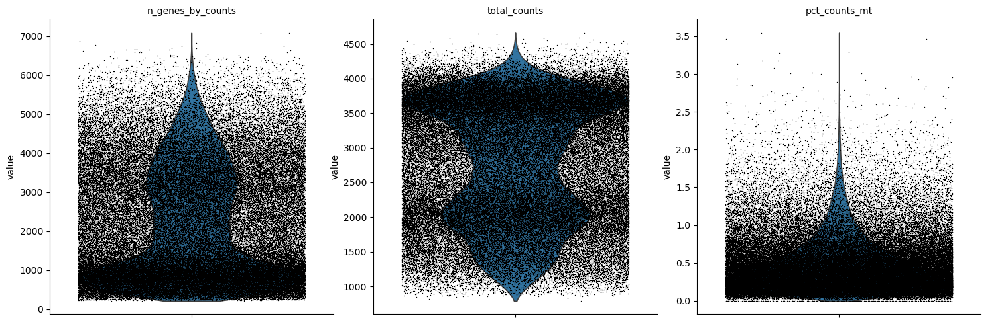

count     12209.000000
mean      18390.727742
std       15953.886715
min         553.000000
25%        6592.000000
50%       12862.000000
75%       25092.000000
max      103242.000000
Name: n_cells_by_counts, dtype: float64


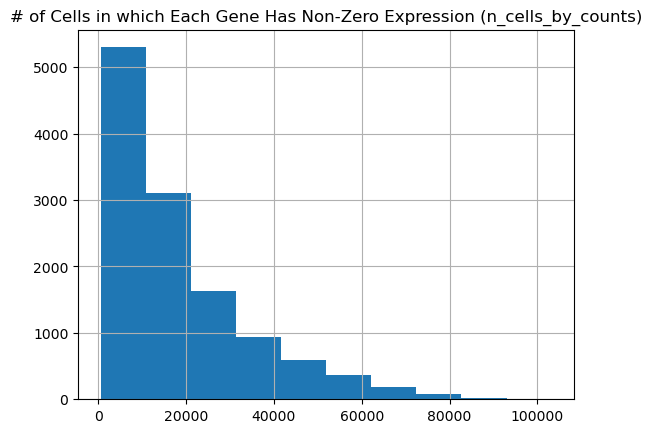

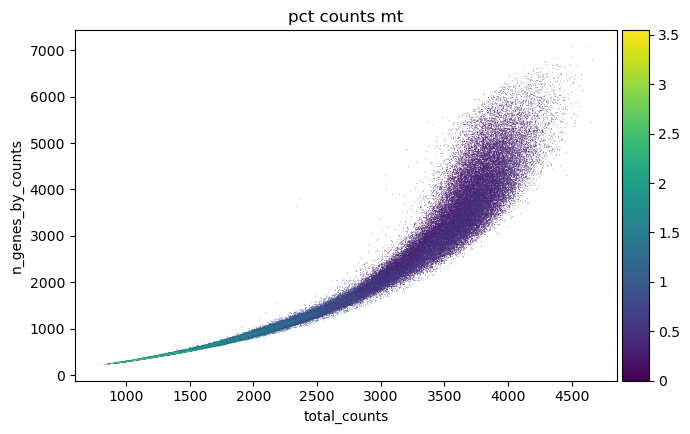

... storing 'kws_integrate' as categorical


AnnData object with n_obs × n_vars = 103274 × 12209
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Source REF.8', 'Term Accession Number.8', 'Parameter Value[light c

,Group,sample,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Strain],Term Source REF.1,Term Accession Number.1,Characteristics[Genotype],Term Source REF.2,Term Accession Number.2,Characteristics[Animal Source],Characteristics[Sex],Term Source REF.3,Term Accession Number.3,Factor Value[Spaceflight],Term Source REF.4,Term Accession Number.4,Factor Value[Age],Unit,Term Source REF.5,Term Accession Number.5,Characteristics[Material Type],Term Source REF.6,Term Accession Number.6,Characteristics[diet],Characteristics[Feeding Schedule],Characteristics[Age at Euthanasia],Unit.1,Term Source REF.7,Term Accession Number.7,Protocol REF,Parameter Value[habitat],Parameter Value[Enrichment material],Parameter Value[duration],Unit.2,Term Source REF.8,Term Accession Number.8,Parameter Value[light cycle],Protocol REF.1,Parameter Value[Euthanasia Method],Parameter Value[Sample Preservation Method],Term Source REF.9,Term Accession Number.9,Parameter Value[Sample Storage Temperature],Unit.3,Term Source REF.10,Term Accession Number.10,Comment[RFID],Comment[Euthanasia Date],n_cells_original_sample,min_max_genes,min_max_cells,max_mt,min_max_counts,zero_center,max_value,doublet_detection,n_genes_by_counts,total_counts,log1p_n_genes_by_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,log1p_total_counts_mt,total_counts_ribo,pct_counts_ribo,log1p_total_counts_ribo,total_counts_hb,pct_counts_hb,log1p_total_counts_hb,n_counts,n_genes,doublet_score,predicted_doublet,resolution_individual,min_dist_individual,leiden_individual,annotation_by_markers_individual,annotation_by_markers_individual_heterogeneous_collapsed,_scvi_batch,_scvi_labels,annotation_scanvi,kws_integrate
AAACAGCCAATCGCAC-1_RRRM2_BRN_GC_ISS-T_YNG_GY4,Ground Control | 12 Weeks,RRRM2_BRN_GC_ISS-T_YNG_GY4,Mus musculus,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,C57BL/6NTac,EFO,http://www.ebi.ac.uk/efo/EFO_0020093,Wild Type,NCIT,http://purl.obolibrary.org/obo/NCIT_C62195,Taconic Biosciences,Female,MESH,http://purl.bioontology.org/ontology/MESH/D005260,Ground Control,OSD,https://osdr.nasa.gov/,12,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Left cerebral hemisphere,FMA,http://purl.org/sig/ont/fma/fma61819,Nutrient Upgraded Rodent Food Bar (NuRFB),ad libitum,20,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Animal Husbandry,Rodent Flight Hardware (Transporter and Habitat),Hut,53,day,UO,http://purl.obolibrary.org/obo/UO_0000033,12 h light/dark cycle,sample collection,"Bilateral thoracotomy with sedation, Cardiac p...",Liquid Nitrogen,NCIT,http://purl.obolibrary.org/obo/NCIT_C68796,-80,degree Celsius,UO,http://purl.obolibrary.org/obo/UO_0000027,6E2A671967,18-Sep-2019,8542,"[321.0, None]","[20, None]",10,"[414.0, 11122.175000000005]",True,10,drop,2074,2960.899414,7.637716,7.993586,13.329097,0.450171,2.662292,10.466295,0.353484,2.439412,1.618296,0.054656,0.962524,4962.0,2152,0.030852,False,0.15,1.5,2,Excitatory,Excitatory,0,0,Excitatory,{'col_celltype': 'annotation_by_markers_indivi...
AAACAGCCAGCACCAT-1_RRRM2_BRN_GC_ISS-T_YNG_GY4,Ground Control | 12 Weeks,RRRM2_BRN_GC_ISS-T_YNG_GY4,Mus musculus,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,C57BL/6NTac,EFO,http://www.ebi.ac.uk/efo/EFO_0020093,Wild Type,NCIT,http://purl.obolibrary.org/obo/NCIT_C62195,Taconic Biosciences,Female,MESH,http://purl.bioontology.org/ontology/MESH/D005260,Ground Control,OSD,https://osdr.nasa.gov/,12,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Left cerebral hemisphere,FMA,http://purl.org/sig/ont/fma/fma61819,Nutrient Upgraded Rodent Food Bar (NuRFB),ad libitum,20,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Animal Husbandry,Rodent Flight Hardware (Transporter and Habitat),Hut,53,day,UO,http://purl.obolibrary.org/obo/UO_0000033,12 h light/dark cycle,sample collection,"Bilateral thoracotomy with sedation, Cardiac p...",Liquid Nitrogen,NCIT,http://purl.obolibrary.org/obo/NCIT_C68796,-80,degree Celsius,UO,http://purl.obolibrary.org/obo/UO_0000027

In [7]:
%%time

# Integration Options
cct_available = kws_cluster is not None and (
    mks_a_priori is not None)  # individual annotations available?
kws_vi = {"early_stopping": True,
          "batch_size": 1024,  # raise/lower if more/less than 16 GB VRAM
          # "max_epochs": 200,
          "accelerator": "gpu",
          "categorical_covariate_keys": covariates_categorical,
          "n_latent": 40, "n_hidden": 400}  # scVI/scANVI arguments
kws_integrate = {
    "col_celltype": cci_scanvi if cct_available else None,
    "flavor": "scanvi",
    # "flavor": "scvi",
    # "flavor": "scanorama",
    # "flavor": "harmony",
    "kws_pp": None, "kws_cluster": None, "n_top_genes": 5000,
    "join": join_method, "merge": "same",
    "col_batch": None,  # suppress using batch as covariate
    "drop_non_hvgs": False,
    "use_rapids": True,
    "fill_value": np.nan if join_method == "outer" else None,
    "out_file": file_concat, **kws_vi
}

# If scVI/scANVI Integration & Individual Annotations Available
if kws_integrate["flavor"] in ["scvi", "scanvi"] and cct_available is True:
    kws_integrate.update({"unlabeled_category": unlabeled_cat})

# Integrate
self = scflow.Rna(files_individual, col_sample=col_sample,
                  col_batch=col_batch, kws_integrate=kws_integrate)
self.rna.obs = self.rna.obs.assign(kws_integrate=str(kws_integrate))

# Write Files for Processed/Integrated Objects?
if overwrite is True or not os.path.exists(file_new):
    self.rna.write_h5ad(file_new)

# Display
print(self.rna)
self.rna.obs

## Benchmark Integration

In [ ]:
# if kws_integrate["flavor"] == "scanvi":
#     try:
#         results_integration_benchmark = scflow.pp.benchmark_integration(
#             self.rna, col_sample, col_celltype="annotation_scanvi")
#     except Exception as err:
#         print(err)

# Clustering

Perform PCA, UMAP embedding, and Leiden clustering on the integrated object

***Constructing neighborhood...
***Embedding UMAP with minimum distance 1.3...
***Performing Leiden clustering with resolution 0.027...
        n_cells
leiden         
5         18485
1         17355
2         16763
0         15012
3          8828
6          8167
7          5200
4          3844
8          3353
9          3121
10         2221
11          925
leiden                            0     1     2     3    4     5    6    7    8    9   10   11
sample                                                                                        
RRRM2_BRN_GC_ISS-T_YNG_GY4       88  1330  1069   953  298  1221  865  419   63  190  142  909
RRRM2_BRN_GC_ISS-T_YNG_GY9       19  1298  1092   753  230   907  547  282   50  197   89    1
RRRM2_BRN_GC_ISS-T_OLD_GO18      51  1121  1424  1045  277   800  542  351   53  178    0    0
RRRM2_BRN_FLT_ISS-T_OLD_FO20     13   768   979   496  215  1243  403  355  219  173   58    0
RRRM2_BRN_GC_ISS-T_OLD_GO19      14  1593  1442  1445  331  1364  567 

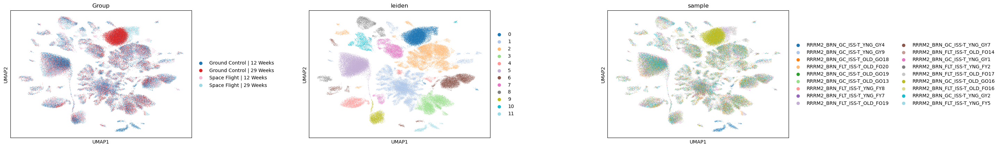

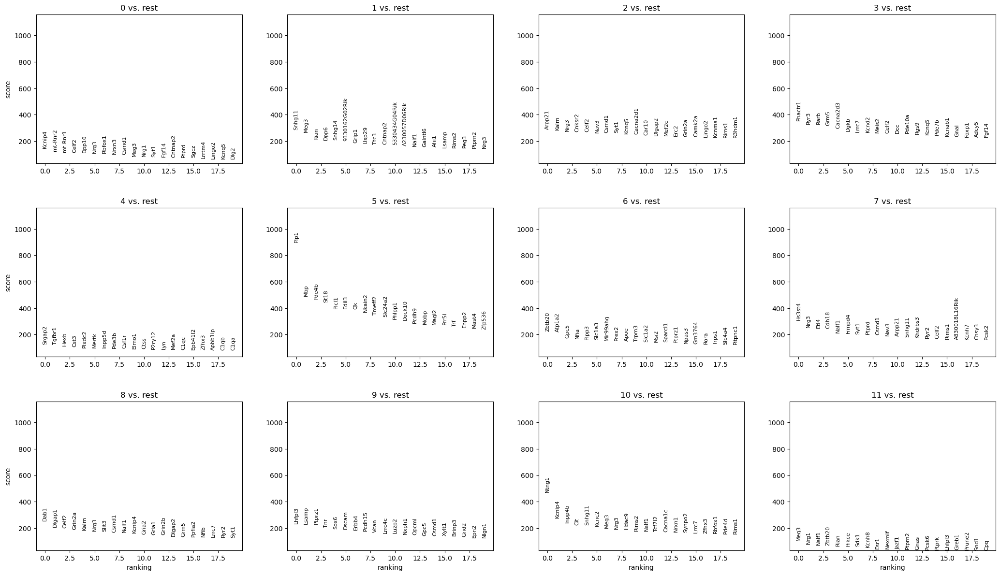

CPU times: user 32.4 s, sys: 2.68 s, total: 35.1 s
Wall time: 11.6 s


In [8]:
%%time

# Clustering Options
resolution, min_dist = 0.027, 1.3
# resolution, min_dist = 0.035, 1.3
# resolution, min_dist = 0.02, 0.6
# resolution, min_dist = 0.018, 0.7
# resolution, min_dist = 0.012, 1.5
# resolution, min_dist = 0.012, 0.5
# resolution, min_dist = 0.0115, 1.5
# resolution, min_dist = 0.011, 0.5
n_neighbors = 40
cct = "leiden"  # key added/column name

# Clustering
self.cluster(col_celltype=cct, resolution=resolution, min_dist=min_dist,
             kws_pca=False, layer="scaled",
             kws_neighbors=dict(n_neighbors=n_neighbors))  # cluster
self.rna.obs = self.rna.obs.assign(**{
       f"{cct}_resolution": resolution}).assign(
              **{f"{cct}_n_neighbors": n_neighbors}).assign(
                     **{f"{cct}_min_dist": min_dist})  # store parameters
_ = self.plot(kind="umap", wspace=0.5, palette="tab20",
              color=[col_batch, "leiden", col_sample])  # plot UMAP
print(self.rna.obs["leiden"].value_counts().to_frame("n_cells"))
print(self.rna.obs.groupby(col_sample).apply(
       lambda x: x["leiden"].value_counts(), include_groups=False).unstack(1))
self.find_markers(col_celltype="leiden")  # DEGs by cluster

# Sub-Clustering

Sub-cluster the biggest <subcluster_biggest> Leiden clusters?

In [9]:
resolution_sub = None if subcluster_biggest is False else 0.005
if subcluster_biggest is not False:
    col_celltype = "leiden_subcluster"
    biggest_clusters = self.rna.obs["leiden"].value_counts().index.values[
        :min(len(self.rna.obs["leiden"].unique()), subcluster_biggest)]
    self.rna.obs.loc[:, col_celltype] = self.rna.obs.leiden.copy()
    for x in biggest_clusters:
        sc.tl.leiden(self.rna, restrict_to=(col_celltype, [x]),
                     key_added=col_celltype, resolution=resolution_sub,
                     seed=0, n_iterations=-1, use_weights=True)
    self.find_markers(col_celltype=col_celltype)  # DEGs by cluster
    self.plot(kind="umap", color=col_celltype)
    print(self.rna.obs[[col_sample, col_celltype]].groupby(
        col_sample).value_counts().unstack(1))
    self.rna.obs.loc[:, f"resolution_{col_celltype}"] = resolution_sub
else:
    col_celltype = "leiden"
self._info["col_celltype"] = col_celltype

# Annotate

Annotate cell types with various methods

## Examine Marker Genes

Also see plot above.

This cell looks at top markers by log2fold-change and adjusted p-value cutoffs and sorts by adjusted p-values.

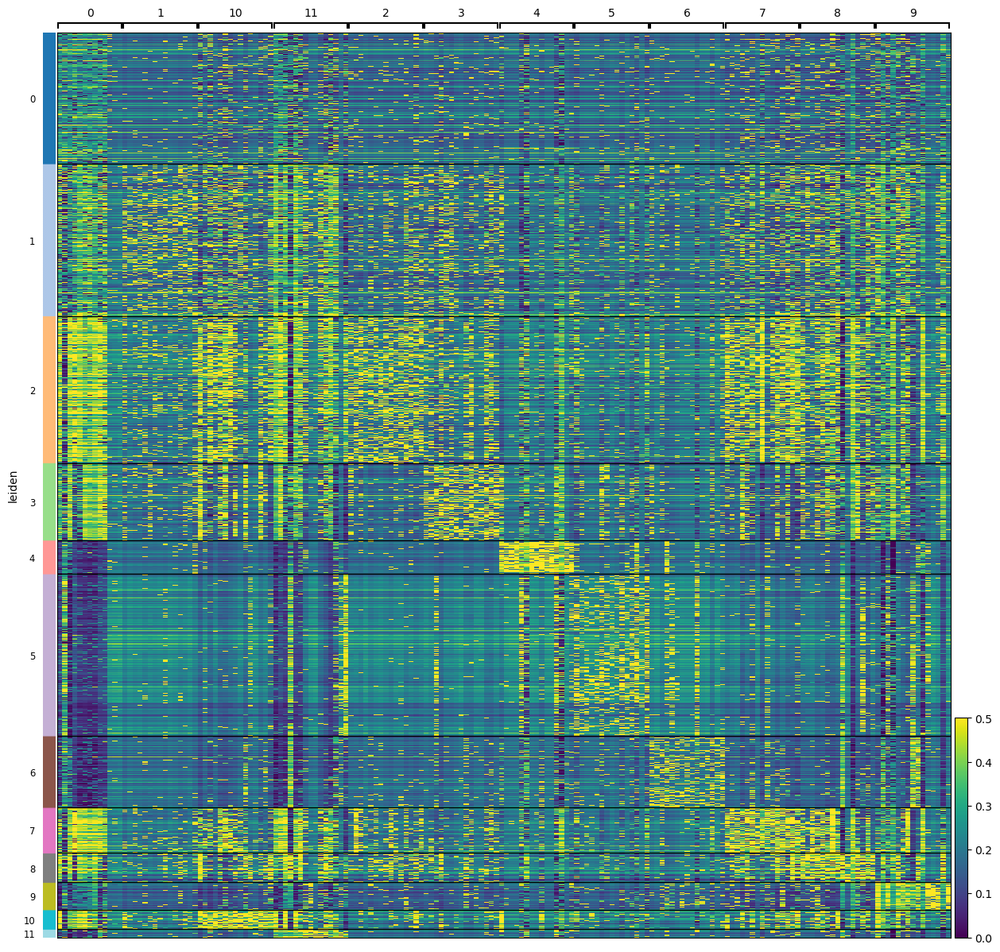

scores  logfoldchanges          pvals      pvals_adj
leiden names                                                                  
2      Lamp5           61.769855        2.115245   0.000000e+00   0.000000e+00
       Gm38073         63.191051        2.158320   0.000000e+00   0.000000e+00
       Pip5k1c         63.105858        1.666480   0.000000e+00   0.000000e+00
       Gm13601         62.978825        3.934681   0.000000e+00   0.000000e+00
       Tbc1d1          62.897785        1.691478   0.000000e+00   0.000000e+00
       Rspo3           62.854904        2.269039   0.000000e+00   0.000000e+00
       Boc             62.798107        2.709826   0.000000e+00   0.000000e+00
       Tmem200a        62.698074        1.971628   0.000000e+00   0.000000e+00
       Mfsd4a          62.609440        1.630422   0.000000e+00   0.000000e+00
       Dusp14          61.955948        2.282474   0.000000e+00   0.000000e+00
       Ntng2           63.462917        2.558998   0.000000e+00   0.000000e+00
       Olfm2           61.687386        1.536477   0.000000e+00   0.000000e+00
       Man1c1          61.552959        1.718423   0.000000e+00   0.000000e+00
       Cpne4           61.364952        1.630494   0.000000e+00   0.000000e+00
       St8sia5         61.347900        1.780161   0.000000e+00   0.000000e+00
10     Slit3           50.649784        1.598728   0.000000e+00   0.000000e+00
       Ero1b           51.785263        2.660792   0.000000e+00   0.000000e+00
       Efna5           51.356846        1.671997   0.000000e+00   0.000000e+00
       Rims3           51.204006        2.747390   0.000000e+00   0.000000e+00
       Hook1           51.161831        1.709680   0.000000e+00   0.000000e+00
       Rasgef1b        51.059589        1.784685   0.000000e+00   0.000000e+00
       Fhod3           50.879417        1.889669   0.000000e+00   0.000000e+00
       Shank3          50.877945        2.225472   0.000000e+00   0.000000e+00
       Nrip3           50.841286        3.071885   0.000000e+00   0.000000e+00
       Pals2           50.744732        1.748262   0.000000e+00   0.000000e+00
       Prox1           51.929565        2.830664   0.000000e+00   0.000000e+00
       Ano5            50.621212        4.058436   0.000000e+00   0.000000e+00
       Fras1           50.570980        2.676167   0.000000e+00   0.000000e+00
       Raver2          53.447609        2.924152   0.000000e+00   0.000000e+00
       Tmem108         53.260498        2.087165   0.000000e+00   0.000000e+00
7      St6gal2         55.019722        1.926521   0.000000e+00   0.000000e+00
       Mpped1          51.887806        2.225578   0.000000e+00   0.000000e+00
       Gm2824          52.471344        2.724010   0.000000e+00   0.000000e+00
       Cx3cl1          52.599411        1.505028   0.000000e+00   0.000000e+00
       Arhgef3         53.119541        1.921127   0.000000e+00   0.000000e+00
       Hdac4           53.213848        1.515722   0.000000e+00   0.000000e+00
       Gm37717         53.226185        3.394957   0.000000e+00   0.000000e+00
       Car10           53.317131        1.519746   0.000000e+00   0.000000e+00
       Gng12           54.120037        2.127865   0.000000e+00   0.000000e+00
       Satb1           51.808521        1.940313   0.000000e+00   0.000000e+00
       Galnt18         55.028976        1.545177   0.000000e+00   0.000000e+00
       Tshz3           55.413143        2.032933   0.000000e+00   0.000000e+00
       Adgrl2          55.579021        1.554702   0.000000e+00   0.000000e+00
       Kcnj6           56.038265        1.720935   0.000000e+00   0.000000e+00
       Ppm1l           56.419365        1.508750   0.000000e+00   0.000000e+00
5      Vps8            63.400597        1.767390   0.000000e+00   0.000000e+00
       Dbndd2          57.330608        2.732808   0.000000e+00   0.000000e+00
       Gsn             57.167854        3.737772   0.000000e+00   0.000000e+00
       Nfe2l3          56.975533        4.156820   0.000000e+00   0.000000e+

In [10]:
markers_df = self.get_markers_df(
    n_genes=15, rankby_abs=False,
    p_threshold=1e-10,
    log2fc_threshold=1.5, log2fc_threshold_abs=False,
    col_celltype=col_celltype)
markers_dict = dict(markers_df.groupby(col_celltype).apply(
    lambda x: list(x.reset_index().names)))
_ = self.plot(genes=markers_dict, figsize=(15, 15),
              kind="heat",
              # kind=["heat", "dot"],
              layer="scaled", standard_scale="obs", vmin=0, vmax=0.5)
markers_df

## Annotate by Marker Gene Overlap

File from https://github.com/nasa/GeneLab_Data_Processing/blob/master/scRNAseq/10X_Chromium_3prime_Data/GeneLab_CellType_GeneMarkers/GL-DPPD-7111_GeneMarker_Files/GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv

**Example of the Expected Marker Definition Format**
```
markers_predefined = {
    "CD4 T cells": {"IL7R"},
    "CD14+ Monocytes": {"CD14", "LYZ"},
    "B cells": {"MS4A1"},
    "CD8 T cells": {"CD8A"},
    "NK cells": {"GNLY", "NKG7"},
    "FCGR3A+ Monocytes": {"FCGR3A", "MS4A7"},
    "Dendritic Cells": {"FCER1A", "CST3"},
    "Megakaryocytes": {"PPBP"},
}
```

annotation_by_overlap
Excitatory               39.95
Inhibitory               25.35
Oligodendrocyte          17.90
Astrocyte                 7.91
Microglial                3.72
OPC                       3.02
Excitatory-Inhibitory     2.15
Name: proportion, dtype: float64


leiden  annotation_by_overlap
5       Oligodendrocyte          17.90
1       Inhibitory               16.80
2       Excitatory               16.23
0       Excitatory               14.54
3       Inhibitory                8.55
6       Astrocyte                 7.91
7       Excitatory                5.04
4       Microglial                3.72
8       Excitatory                3.25
9       OPC                       3.02
10      Excitatory-Inhibitory     2.15
11      Excitatory                0.90
Name: proportion, dtype: float64

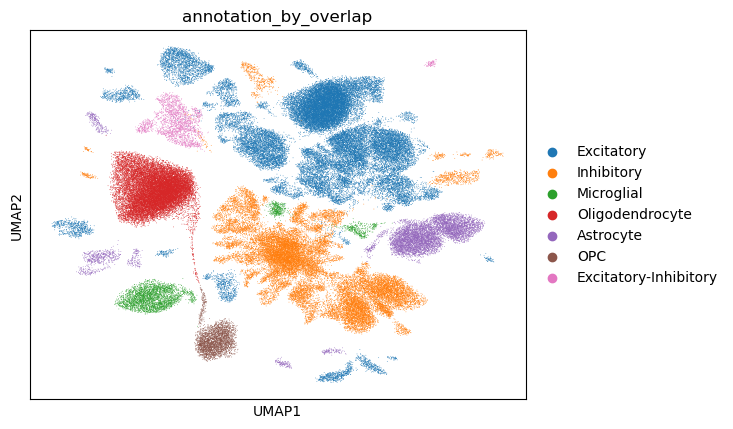

In [11]:
# Annotate
marker_matches = self.annotate(
    markers_predefined,
    celltypes_superhierarchical=celltypes_superhierarchical,
    col_celltype=col_celltype, col_celltype_new="annotation_by_overlap",
    # top_n_markers=50,  # can only have this one or `adj_pval_threshold`
    adj_pval_threshold=1e-10,
    method="overlap_coef", overwrite=True)

# Rename Any Labels As Pre-Specified
if rename_marker_based_annotation is not None:
    self.rna.obs.loc[:, "annotation_by_overlap"] = self.rna.obs[
        "annotation_by_overlap"].replace(rename_marker_based_annotation)

# Print & Plot Results
self.plot(kind="umap", color="annotation_by_overlap")
print(round(self.rna.obs["annotation_by_overlap"].value_counts(
    normalize=True) * 100, 2))
round(self.rna.obs[[col_celltype, "annotation_by_overlap"]
                   ].value_counts(normalize=True)* 100, 2)

## Annotate with ToppGene

In [12]:
# Options
min_genes = 2  # minimum markers that have to overlap between Leiden & atlas
remove_strings = ["----L1-6", # "---[|]M.*",
                  "facs-", "-nan-",
                  # "-i_Gaba_3-.*",
                  "Brain_organoid-organoid_Kanton_Nature-Organoid-..-",
                  # "Non-neuronal-Macroglial-((^|)(Oligo|Astro))+-",
                  # "-Glut_E.*IL7R",
                  "cells hierarchy compared to all cells using T-S.*",
                  ".*-organoid_Tanaka_cellReport-.+-",
                  "...BrainAtlas -.*", "-eN2.*", "...Sample groups.*",
                  "...Sample Type, Dataset.*",
                  "-Neuronal",
                  " // Primary Cells by Cluster",
                  ".World...Primary Cells by Cluster",
                  "Brain_organoid-organoid_Velasco_nature-6_",
                  "Fetal_brain-fetalBrain_Zhong_nature-....-",
                  "Somatosensory_Cortex_....-Neuronal-",
                  "Non-neuronal-Non-dividing-",
                  "...Sample groups..6 Anatomical region groups., with 5.*",
                  "Brain_organoid-organoid_Paulsen_bioRxiv-",
                  "-Glut_E_(THEMIS)", "[(]THEMIS[)]",  # "[|].*",
                  "- method, tissue, subtissue, age, lineage.*"]
drop_name_patterns = ["striatum", "globus", "Entopeduncular",
                      "Substantia_nigra-", "Thalamus-"]
toppgene_rename_by_pattern = dict(
    Inhibitory=["Inh(_|ib)", "GABA"], Excitatory=["Excit", "Glut"],
    # Inhibitory=["Inh(_|ib)"], Excitatory=["Excit"],
    # # Gabaergic=["GABA"], Glutamatergic=["Glut"],
    Astrocyte=["Astrocyte","Astroglia", "Macroglial-Astro"],
    Microglia=["Microglia", "Micro"],
    Endothelial=["Endothelial"],
    Oligodendrocyte=[r"^(?=.*oligo)(?!.*poly)(?!.*opc).*"],
    OPC=["Polydendrocyte", "OPC"])
drop_regions = [
    "Mid-temporal_gyrus_(MTG)", "primary_auditory_cortex_(A1C)",
    "Somatosensory_Cortex_(S1)", "Anterior_Cingulate_gyrus_(CgG)",
    "Primary_Motor_Cortex_(M1)",
    "Mid-temporal_gyrus_(MTG)|Mid-temporal_gyrus_(MTG)",
    "primary_auditory_cortex_(A1C)|primary_auditory_cortex_(A1C)",
    "Somatosensory_Cortex_(S1)|Somatosensory_Cortex_(S1)",
    "Anterior_Cingulate_gyrus_(CgG)|Anterior_Cingulate_gyrus_(CgG)",
    "Primary_Motor_Cortex_(M1)|Primary_Motor_Cortex_(M1)",
    r"Neuronal|World / ",
    "Primary_Visual_cortex_(V1C)|Primary_Visual_cortex_(V1C)",
    "mon",
    "BMP_responsible_cell|6m", "bearing_cell|6m", "bearing_cell|GW16", "11",
    "Non-neuronal-Non-dividing",
    "Frontal_cortex|Frontal_cortex",
    "Primary_Visual_cortex_(V1C)", "Substantia_nigra",
    "Thalamus", "Hippocampus", "Frontal_cortex"
]  # remove if name is just a region or top-level hierarchical/undesired type
drop_regions = drop_regions + [f"{i}-Non-neuronal" for i in drop_regions]

# Query ToppGene
results_toppgene = scflow.pp.annotate_by_toppgene(
    markers_dict, remove_strings=remove_strings,
    species=species, min_genes=min_genes, source_patterns=source_patterns)

# Remove or Alter Certain Name Patterns
drop_names = results_toppgene.Name.apply(lambda x: not any((
    i.lower() in x.lower() for i in drop_name_patterns)))
results_toppgene = results_toppgene[drop_names]
rn_tg = results_toppgene.Name.apply(lambda x: {x: " | ".join([
    j for j in toppgene_rename_by_pattern if any((re.search(i.lower(
        ), x.lower()) is not None for i in toppgene_rename_by_pattern[
            j]))])}).apply(lambda x: np.nan if x[list(x.keys())[
                0]] == "" else x).dropna().reset_index(drop=True).apply(
                    lambda x: pd.Series(x)).stack().reset_index(
                        0, drop=True)  # renaming guide
results_toppgene = results_toppgene.replace({"Name": dict(rn_tg)})
results_toppgene = results_toppgene[~results_toppgene.Name.isin(drop_regions)]

# Map Labels (Plurality Vote If Sufficient or Top)
top_cs = dict(results_toppgene.groupby(
    "Gene Set").apply(lambda x: x.Name.iloc[:10].value_counts().index.values[
        0] if x.Name.iloc[:10].value_counts(
            normalize=True).iloc[0] >= 0.25 else x.Name[0]))
print("\n".join([f"{k}: {top_cs[k]}" for k in top_cs]), "\n\n")
if "annotation_toppgene" in self.rna.obs:
    self.rna.obs = self.rna.obs.drop("annotation_toppgene", axis=1)
self.rna.obs = self.rna.obs.join(self.rna.obs[col_celltype].replace(
    top_cs).to_frame("annotation_toppgene")).loc[self.rna.obs.index]

# Display Results
if "annotation_by_overlap" in self.rna.obs:
    print(round(self.rna.obs[["annotation_toppgene", "annotation_by_overlap"]
                             ].value_counts(normalize=True).sort_index(
                                 ) * 100, 2), "\n\n")
print(round(self.rna.obs["annotation_toppgene"].value_counts(
    normalize=True) * 100, 2))
results_toppgene.reset_index("ID", drop=True).drop([
    "QValueBonferroni", "QValueFDRBY", "QValueFDRBH",
    "TotalGenes", "Genes"], axis=1)

0: OPC
1: Inhibitory
10: Excitatory
11: Oligodendrocyte
2: Excitatory
3: Inhibitory
4: Microglia | Endothelial
5: Oligodendrocyte
6: Astrocyte
7: Excitatory
8: Inhibitory
9: OPC 


annotation_toppgene      annotation_by_overlap
OPC                      Excitatory               14.54
                         OPC                       3.02
Inhibitory               Excitatory                3.25
                         Inhibitory               25.35
Excitatory               Excitatory               21.27
                         Excitatory-Inhibitory     2.15
Microglia | Endothelial  Microglial                3.72
Oligodendrocyte          Excitatory                0.90
                         Oligodendrocyte          17.90
Astrocyte                Astrocyte                 7.91
Name: proportion, dtype: float64 


annotation_toppgene
Inhibitory                 28.60
Excitatory                 23.42
Oligodendrocyte            18.79
OPC                        17.56
Astrocyte               

Name    PValue GenesInTerm GenesInQuery GenesInTermInQuery                                             Source  \
Gene Set Category                                                                                                                                                               
0        ToppCell                                         Excitatory       0.0         195           10                  6      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Excitatory       0.0         192           10                  4      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                                OPC       0.0         200           10                  4                              Human Adult Brain MTG   
         ToppCell                                                OPC       0.0         200           10                  4                              Human Adult Brain MTG   
         ToppCell                                                OPC       0.0         200           10                  4                              Human Adult Brain MTG   
         ToppCell                                                OPC       0.0         200           10                  4                              Human Adult Brain MTG   
         ToppCell                                                OPC       0.0         200           10                  4                              Human Adult Brain MTG   
         ToppCell                                                OPC       0.0         200           10                  4                              Human Adult Brain MTG   
         ToppCell                                         Excitatory  0.000008         186           10                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Excitatory  0.000009         189           10                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Excitatory  0.000009         190           10                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Excitatory  0.000009         190           10                  3      Human Adult Multiple Cortical Areas SMART-seq   
1        ToppCell                                         Inhibitory       0.0         171           12                  5      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Inhibitory       0.0         169           12                  4  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                                         Inhibitory       0.0         170           12                  4      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Inhibitory       0.0         200           12                  4                              Human Adult Brain MTG   
         ToppCell                                         Inhibitory       0.0         200           12                  4                              Human Adult Brain MTG   
         ToppCell                                         Inhibitory  0.000011         168           12                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Inhibitory  0.000014         184           12                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Inhibitory  0.000015         185           12                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Inhibitory  0.000015         185           12                  3      Human Adult Multiple Cortical Areas SMART-

## Annotate with CellTypist

2025-08-17 20:42:47 | [WARNING] ⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
2025-08-17 20:42:47 | [INFO] 🔬 Input data has 103274 cells and 12209 genes
2025-08-17 20:42:47 | [INFO] 🔗 Matching reference genes in the model
2025-08-17 20:42:48 | [INFO] 🧬 3199 features used for prediction
2025-08-17 20:42:48 | [INFO] ⚖️ Scaling input data
2025-08-17 20:42:52 | [INFO] 🖋️ Predicting labels
2025-08-17 20:42:53 | [INFO] ✅ Prediction done!
2025-08-17 20:42:53 | [INFO] 👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
2025-08-17 20:42:53 | [INFO] ⛓️ Over-clustering input data with resolution set to 25
2025-08-17 20:42:55 | [INFO] 🗳️ Majority voting the predictions
2025-08-17 20:42:55 | [INFO] ✅ Majority voting done!


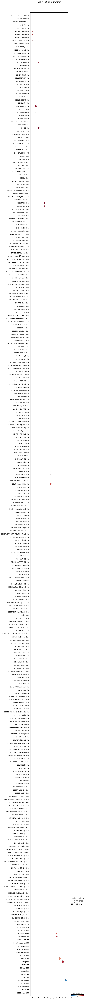

<timed exec>:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


annotation_toppgene      annotation_by_overlap  annotation_majority_voting
OPC                      Excitatory             Glutamatergic                   182
                                                Gabaergic                        95
                                                Oligodendrocyte                  12
                                                330 VLMC NN                       1
                                                Heterogeneous                 14722
                         OPC                    Polydendrocyte                 2922
                                                Oligodendrocyte                 199
Inhibitory               Excitatory             Glutamatergic                  3353
                         Inhibitory             Glutamatergic                  1842
                                                Gabaergic                     17507
                                                Dopaminergic                     22
 

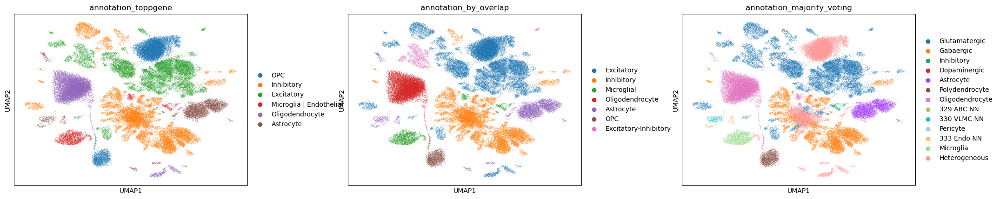

In [13]:
%%time

# To Aggregate More Specific Cell Types
celltypist_rename_by_pattern = dict(
    Gabaergic=["GABA"], Glutamatergic=["Glut"],
    Dopaminergic=["Dopa"], Serotonergic=["Sero"],
    Inhibitory=["Inh"], Excitatory=["Exc"],
    Astrocyte=["Astro"],
    Microglia=["Microglia"],
    Pericyte=["peri"],
    Monocyte=["Monocyte"],
    Lymphoid=["Lymphoid"],
    Endothelial=["Endothelial"],
    Oligodendrocyte=[r"^(?=.*oligo)(?!.*poly)(?!.*opc).*"],
    Polydendrocyte=["OPC"])

# Run CellTypist
self.rna.X = self.rna.layers["log1p"].copy()
predictions = self.annotate(
    model_celltypist, col_celltype=col_celltype, layer="log1p",
    col_celltype_new="", majority_voting=True, min_prop=0.5, use_GPU=True)
if "majority_voting" in self.rna.obs:
    self.rna.obs.loc[:, "majority_voting_short"] = self.rna.obs[
        "majority_voting"].apply(lambda x: " ".join(x.split(
            " ")[1:]) if all((i in [str(i) for i in np.arange(
                0, 10)] for i in x.split(" ")[
                    0])) else x)  # drop pointless #s in front of cell types

# Rename Cell Types
rn_ct = predictions.predicted_labels.groupby("majority_voting").apply(
    lambda x: {x.name: " | ".join([
        j for j in celltypist_rename_by_pattern if any((re.search(
            i.lower(), x.name.lower()) for i in celltypist_rename_by_pattern[
                j]))])}).apply(lambda x: {list(x.keys())[0]: list(x.keys(
                    ))[0]} if x[list(x.keys())[0] ] == "" else x).apply(
                        lambda x: pd.Series(x)).stack().reset_index(
                            0, drop=True)
if "annotation_majority_voting" in self.rna.obs:
    self.rna.obs = self.rna.obs.drop("annotation_majority_voting", axis=1)
self.rna.obs = self.rna.obs.join(self.rna.obs.replace({
    "majority_voting": dict(rn_ct)})["majority_voting"].to_frame(
        "annotation_majority_voting"))
cols = [i for i in ["annotation_toppgene", "annotation_by_overlap",
                    "annotation_majority_voting"] if i in self.rna.obs]

# Plot UMAPs
self.plot(kind="umap", color=cols, wspace=0.3)

# Compare
print(self.rna.obs[cols].value_counts().sort_index())

## Annotate with Map My Cells

- Make sure to run the following bash commonds after activating the conda environment used for this notebook.

- Pull [`cell_type_mapper`](https://github.com/AllenInstitute/cell_type_mapper) from GitHub (clone into your home directory): `cd && git clone git@github.com:AllenInstitute/cell_type_mapper.git`

- Navigate to that directory and run `pip install .`

- Navigate to the folder containing this notebook.

- Install ABC Atlas (while in same directory as this notebook): `pip install -U git+https://github.com/alleninstitute/abc_atlas_access >& scratch/junk.txt`

- Pull lookup files (while in same directory as this notebook):
```
cd resources
wget https://allen-brain-cell-atlas.s3-us-west-2.amazonaws.com/mapmycells/WMB-10X/20240831/mouse_markers_230821.json
wget https://allen-brain-cell-atlas.s3-us-west-2.amazonaws.com/mapmycells/WMB-10X/20240831/precomputed_stats_ABC_revision_230821.h5
```

---

Note: To use GPU + Torch, you may need to alter the file "cell_type_mapper/src/cell_type_mapper/cell_by_gene/cell_by_gene.py" line `np.where(np.logical_not(np.isfinite(data)))[0]` to read instead

```
try:
    nan_rows = np.where(
        np.logical_not(np.isfinite(data.cpu().numpy())))[0]
except Exception:
    nan_rows = np.where(np.logical_not(np.isfinite(data)))[0]
```

You may have to run the following code in this notebook:

```
os.environ["NUMEXPR_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OMP_NUM_THREADS"] = "1"
```

and

    `_correlation_dot_gpu()` in distance_utils.py change
    `correlation = torch.matmul(arr0, arr1)` to

```
try:
    correlation = torch.matmul(arr0, arr1)
except RuntimeError as err:
    if "CUBLAS_STATUS_NOT_INITIALIZED" in str(err):
        arr0_cpu = arr0.cpu()
        arr1_cpu = arr1.cpu()
        correlation = torch.matmul(arr0_cpu, arr1_cpu).to(arr0.device)
    else:
        raise
```

to manage processes/memory.

### Run Map My Cells

In [ ]:
# %%time

# # Write File to Use as Input for Map My Cells
# if overwrite is True or not os.path.exists(file_new):
#     os.makedirs("data", exist_ok=True)
#     self.rna.X = self.rna.layers["counts"]
#     self.rna.write_h5ad(file_new)
# else:
#     raise ValueError("Must be able to overwrite to run Map My Cells.")

# # Run Map My Cells
# self.rna = scflow.pp.run_mapbraincells(
#     file_new, map_my_cells_source=map_my_cells_source,
#     dir_scratch="scratch", dir_resources="resources",
#     validate_output_file="scratch/tmp.h5ad",  # map_to_ensembl=True,
#     map_my_cells_region_keys=map_my_cells_region_keys,
#     map_my_cells_cell_keys=map_my_cells_cell_keys, verbose_stdout=True,
#     n_processors=4, chunk_size=5000, max_gb=5)

### View Map My Cells Results

In [ ]:
# _ = self.plot(kind="umap", color=["cellmap_class_name"])
# if "annotation_toppgene" in self.rna.obs:
#     print(self.rna.obs[["cellmap_class_name", "annotation_toppgene"]
#                        ].value_counts().sort_index())
# self.rna.obs[[i for i in self.rna.obs if "cellmap" in i and "ori" not in i]]

# OSD-613-Specific

Clean variable names & keys

In [14]:
self.rna.obs.loc[:, "Age_Start"] = self.rna.obs["Factor Value[Age]"].astype(
    str) + " Weeks"
self.rna.obs.loc[:, "Age_End"] = self.rna.obs[
    "Characteristics[Age at Euthanasia]"].astype(str) + " Weeks"
self.rna.obs.loc[:, "Condition"] = self.rna.obs["Factor Value[Spaceflight]"]
if "cellmap_class_name" in self.rna.obs:  # cell name w/o region cues
    self.rna.obs.loc[:, "cellmap_class_name_collapsed"] = self.rna.obs[
        "cellmap_class_name"].apply(lambda x: x + "***" + str(
            "Glutamatergic-" if ("glut" in x.lower()) else "") + str(
                "GABAergic-" if "gaba" in x.lower() else "") + str(
                    "Oligodendrocyte-" if "oligo" in x.lower() else "") + str(
                        "Cholinergic-" if "chol" in x.lower() else ""))
    self.rna.obs.loc[:, "cellmap_class_name_collapsed"] = self.rna.obs[
        "cellmap_class_name_collapsed"].apply(
            lambda x: x.split("***")[0 if x.split("***")[1] == "" else 1])
    self.rna.obs.loc[:, "cellmap_class_name_collapsed"] = self.rna.obs[
        "cellmap_class_name_collapsed"].apply(
            lambda x: x[:-1] if x[-1] == "-" else x)

# Test

Make sure preprocessing properly implemented

In [ ]:
for x in kws_pp:
    print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}\n")
    ann = self.rna[self.rna.obs[col_sample] == x]
    if join_method == "inner":
        assert all(ann.var["n_cells_by_counts"] >= kws_pp[
            x]["min_max_cells"][0])
        assert all(ann.var["n_cells_by_counts"] <= kws_pp[
            x]["min_max_cells"][1]) if kws_pp[x]["min_max_cells"][1] else True
    assert all(ann.obs["n_genes_by_counts"] >= kws_pp[x]["min_max_genes"][0])
    assert all(ann.obs["n_genes_by_counts"] <= kws_pp[x][
        "min_max_genes"][1]) if kws_pp[x]["min_max_genes"][1] else True
    assert all(ann.obs["pct_counts_mt"] <= kws_pp[x]["max_mt"])
    assert all(ann.obs["total_counts"] >= kws_pp[x]["min_max_counts"][0])
    assert all(ann.obs["total_counts"] <= kws_pp[x]["min_max_counts"][1]) if (
        kws_pp[x]["min_max_counts"][1]) else True
    print(kws_pp[x])
    print(ann.obs[["n_genes_by_counts", "pct_counts_mt", "total_counts"]
                  ].describe().loc[["min", "max"]])
    print(ann.var[["n_cells_by_counts"]].describe().loc[[
        "min", "max"]])

# Final Write

In [ ]:
# Descriptives
if all((i in self.rna.obs for i in [
        "Factor Value[Age]", "Characteristics[Age at Euthanasia]"])):
    print(self.rna.obs[["Factor Value[Age]",
                        "Characteristics[Age at Euthanasia]"]].value_counts())

# Write h5ad
if overwrite is True or not os.path.exists(file_new):
    print("\n\n", f"Writing file to {file_new}...")
    self.rna.write_h5ad(file_new)

# Write Version Compatible with Older Packages
adata = self.rna.copy()
adata.uns = {}
adata.write_h5ad(os.path.splitext(file_new)[0] + "_compatible.h5ad")

Send Email with Output When Done
if email is not None and html_out is not None:
    os.system(f"jupyter nbconvert --to html {cur_file}")
    os.system(f"echo 'yay' | mutt -s 'JOB DONE' -a {html_out} -- {email}")

... storing 'Age_Start' as categorical
... storing 'Age_End' as categorical


Factor Value[Age]  Characteristics[Age at Euthanasia]
29                 37                                    55266
12                 20                                    48008
Name: count, dtype: int64


 Writing file to data/OSD-613_integrated.h5ad...


NameError: name 'pos' is not defined

# Scratch (IGNORE)

In [ ]:
# # Integrate
# join_method = "inner"
# cct = "leiden_individual" if kws_cluster is not None else None
# kws_integrate = {"col_celltype": cct,
#                  "flavor": "scanvi",
#                  # "flavor": "scvi",
#                  # "flavor": "scanorama",
#                  # "flavor": "harmony",
#                 "kws_pp": None, "kws_cluster": None, "n_top_genes": 1000,
#                  "join": join_method, "merge": "same",
#                  "col_batch": None,  # suppress using batch as covariate
#                  "drop_non_hvgs": False,
#                  "use_rapids": True,
#                  "fill_value": np.nan if join_method == "outer" else None,
#                  "out_file": file_new}
# self = scflow.Rna(sc.read(file_new), col_sample=col_sample,
#                   col_batch=col_batch, kws_integrate=kws_integrate)

# # Write Files for Processed/Integrated Objects?
# if overwrite is True or not os.path.exists(file_new):
#     self.rna.write_h5ad(file_new)

# # Display
# print(self.rna)
# self.rna.obs